[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1UIC220k-PPl62muJZlk7jogwjG4u9ZJ_?usp=sharing)

# ✨ Traffic Light Detection using YOLOv8 🚀

This project demonstrates how to train a YOLOv8 model to detect traffic lights in images and videos. We'll use a custom dataset from Roboflow and leverage the power of Ultralytics YOLOv8 for object detection.

# 🚦 Importing Libraries

In [ ]:
#Importing  os to create a helper variable, which allows us to easily manages different paths in the code
import os


In [ ]:
#glob is used to return all file paths that match a specific pattern.
import glob

In [ ]:
# If we want to display a single image, then "Image" Library is fine, but if we want to display multiple images by just running a single cell
# then we need to import display

from IPython.display import Image, display

In [ ]:
# To clear output in the notebook use clear_output function
#display.clear_output()

# **In the First Step, We need to check whether we have access to the GPU or not**

In [ ]:
!nvidia-smi

Thu Nov 21 10:16:24 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
HOME = os.getcwd()

# 🚀 **Installing Ultralytics**  

Ultralytics provides easy-to-use tools for building and deploying YOLO models.

#### **📦 What Does This Include?**

The installation provides:  
- YOLO models (YOLOv8 and beyond)  
- Tools for training, prediction, and deployment  
- Built-in integrations for datasets and visualization  


In [ ]:
!git clone https://github.com/MuhammadMoin97/ultralytics.git

Cloning into 'ultralytics'...
remote: Enumerating objects: 3878, done.
remote: Total 3878 (delta 0), reused 0 (delta 0), pack-reused 3878 (from 1)
Receiving objects: 100% (3878/3878), 1.82 MiB | 9.97 MiB/s, done.
Resolving deltas: 100% (2691/2691), done.


#**Setting the Current Directory**

In [ ]:
%cd {HOME}/ultralytics

/content/ultralytics


#**Installing all the Dependencies**

In [ ]:
!pip install -e '.[dev]'

Obtaining file:///content/ultralytics
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.8/234.8 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 70.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 71.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.8/111.8 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.4/263.4 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 8.2 MB/s eta 0:00:00
   ━━━━

##Checking whether YOLOv8 is Installed and its working Fine

In [ ]:
import ultralytics

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.0.3 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.6/112.6 GB disk)


# **📂 Importing the Traffic Lights Dataset**

The dataset is hosted on Roboflow. Follow these steps to set up the dataset:

In [ ]:
HOME = '/content/ultralytics/ultralytics/yolo/v8/detect'

In [ ]:
%cd {HOME}
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="iOqPD5zonb3Ou6XZ2Xpe")
project = rf.workspace("wawan-pradana").project("cinta_v2")
dataset = project.version(1).download("yolov5")

/content/ultralytics/ultralytics/yolo/v8/detect
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.7 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to cinTA_v2-1 in yolov5pytorch:: 100%|██████████| 4806/4806 [00:00<00:00, 6435.45it/s]


# **🏋️‍♂️ Training the YOLOv8 Model**

Train the YOLOv8 model on the custom dataset with 80 epochs and an image size of 640:

In [ ]:
%cd {HOME}

/content/ultralytics/ultralytics/yolo/v8/detect


In [ ]:
%cd {dataset.location}

/content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1


In [ ]:
%cd {HOME}

!python train.py model=yolov8l.pt data={dataset.location}/data.yaml epochs=80 imgsz=640

Streaming output truncated to the last 5000 lines.
      63/80      11.6G     0.8324     0.4592        1.1         39        640:  11% 15/132 [00:13<01:39,  1.17it/s]/content/ultralytics/ultralytics/yolo/engine/trainer.py:290: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self.amp):
      63/80      11.6G      0.842     0.4605      1.103         27        640:  12% 16/132 [00:14<01:38,  1.17it/s]/content/ultralytics/ultralytics/yolo/engine/trainer.py:290: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self.amp):
      63/80      11.6G     0.8377     0.4578      1.095         37        640:  13% 17/132 [00:15<01:36,  1.19it/s]/content/ultralytics/ultralytics/yolo/engine/trainer.py:290: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.auto

In [ ]:
!ls {HOME}/runs/detect/train

args.yaml					   F1_curve.png  predictions.json  results.png
confusion_matrix.png				   P_curve.png	 R_curve.png	   weights
events.out.tfevents.1732184265.da0513823b3c.828.0  PR_curve.png  results.csv


# **📊 Displaying the Confusion Matrix**

Evaluate the model’s performance on different classes using a confusion matrix:

In [ ]:
from IPython.display import Image

/content/ultralytics/ultralytics/yolo/v8/detect


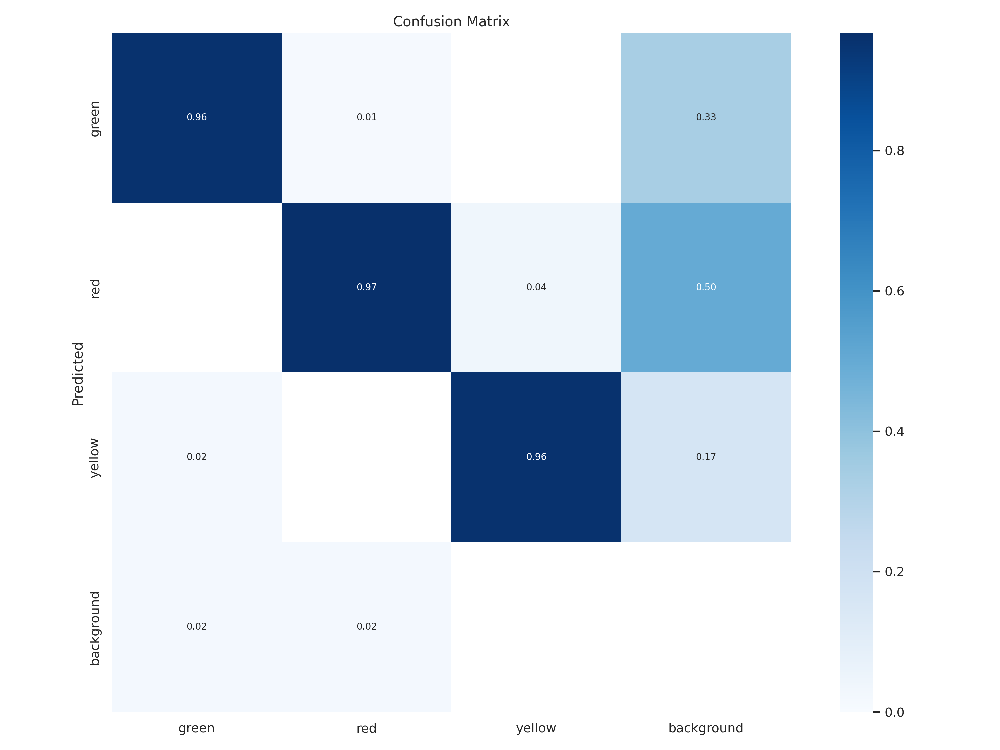

In [ ]:
#Confusion matrix is the chart that shows how our model handles different classes
#96% of the time the model detected correctly that currently the green light is on, while 2% of the time we get the Bounding Box but
#the green light is incorrectly classified as red light, while 1% of the time we also get the bounding box but the green light
#is incorrectly classified as yellow,  light while 1% of the time when the green light is on the model is unable to detect it
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=900)

## 🚦 Training and Validation Loss

Here is the graph of the training and validation loss:

/content/ultralytics/ultralytics/yolo/v8/detect


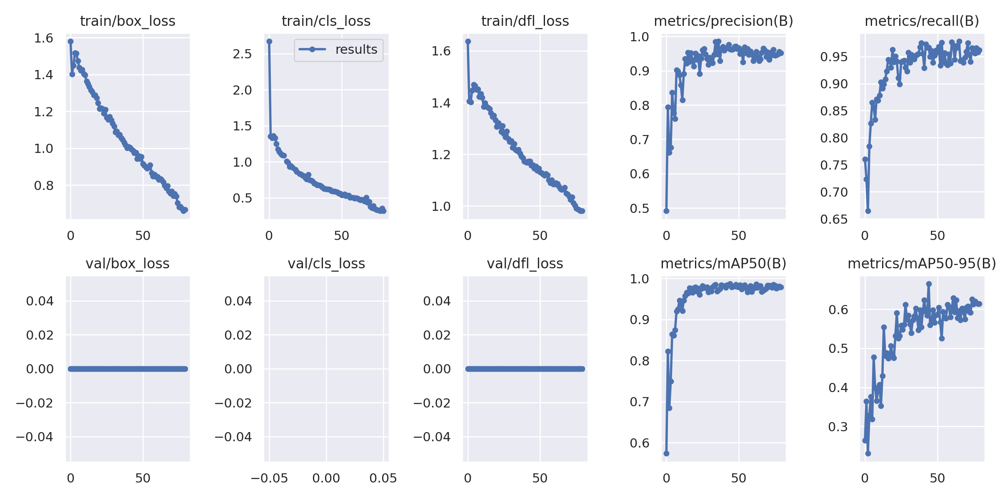

In [ ]:
# Here is the graph of the training and validation loss
#box loss and class loss is important
# The behavior of the model is convincing the model is coverging, Training more will give better results
%cd {HOME}

Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

# **✔️ Validating the Custom Model**

Validate the model using the best weights from training:

In [ ]:
#Here, we are taking the model best weights and using them to validate the model

%cd {HOME}

!python val.py model='{HOME}/runs/detect/train/weights/best.pt' data={dataset.location}/data.yaml

/content/ultralytics/ultralytics/yolo/v8/detect
2024-11-21 12:56:56.995537: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-21 12:56:57.029572: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-21 12:56:57.042791: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-21 12:56:57.064480: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flag

# **🖼️ Inference on Test Dataset**

Test the trained model on the test dataset images:

In [ ]:
# Testing the Model on Test Dataset images
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train/weights/best.pt' source='/content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images'

/content/ultralytics/ultralytics/yolo/v8/detect
2024-11-21 12:57:49.068970: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-21 12:57:49.088559: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-21 12:57:49.094364: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-21 12:57:49.108145: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flag

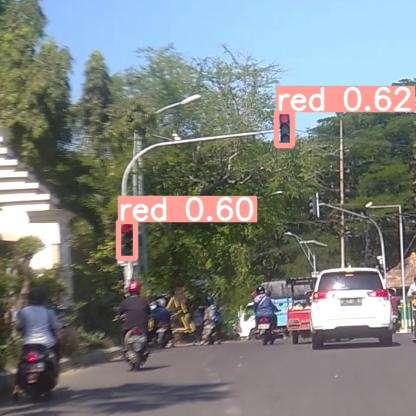

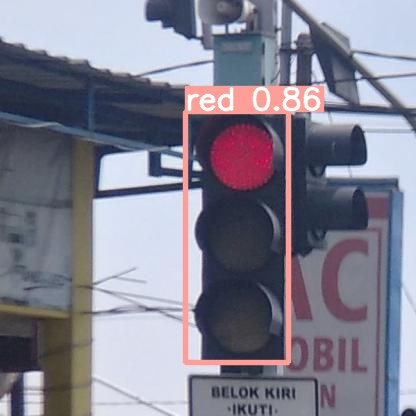

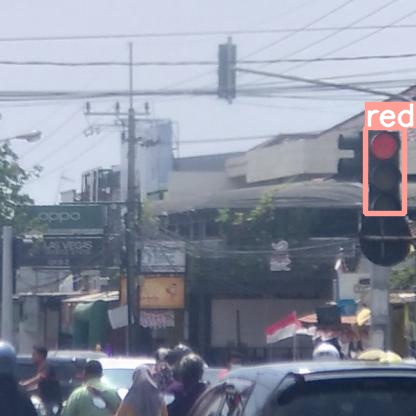

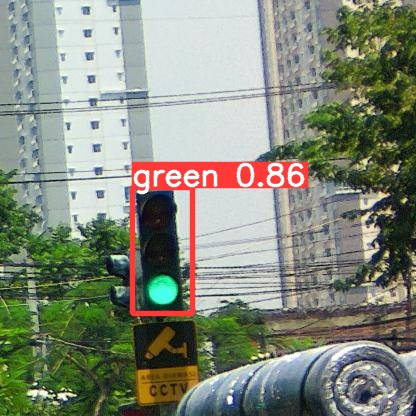

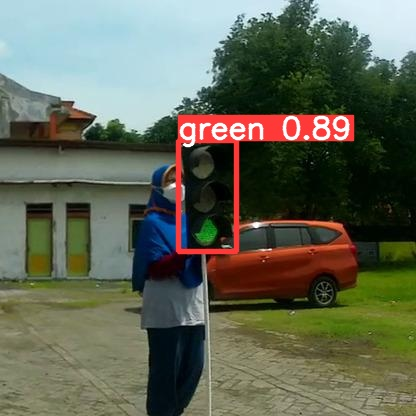

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train3/*.jpg')[:5]:
      display(Image(filename=image_path, width=600))
      print("\n")

# **🎥 Testing on a Demo Video**

In [ ]:
!gdown --fuzzy "https://drive.google.com/file/d/1eBgdqMnHuJEgJi-YQtTBnbf5Gcj7kqmj/view?usp=sharing"

Downloading...
From: https://drive.google.com/uc?id=1eBgdqMnHuJEgJi-YQtTBnbf5Gcj7kqmj
To: /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4
100% 4.50M/4.50M [00:00<00:00, 41.0MB/s]


In [ ]:
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train/weights/best.pt' source='video1.mp4' conf=0.45

/content/ultralytics/ultralytics/yolo/v8/detect
2024-11-21 13:06:32.101902: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-21 13:06:32.121447: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-21 13:06:32.127401: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-21 13:06:32.141727: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flag

#**Display the Demo Video**

In [ ]:
!rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train5/video1.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**Downloading the Demo Video2**

In [ ]:
!gdown --fuzzy "https://drive.google.com/file/d/1QpUp2IXnkH44WxVmqqyuiKDsXSuoaIxZ/view?usp=sharing"

Downloading...
From: https://drive.google.com/uc?id=1QpUp2IXnkH44WxVmqqyuiKDsXSuoaIxZ
To: /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4
100% 412k/412k [00:00<00:00, 136MB/s]


#**Testing on the Demo Video**

In [ ]:
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train/weights/best.pt' source='video2.mp4'

/content/ultralytics/ultralytics/yolo/v8/detect
2024-11-21 13:09:31.684085: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-21 13:09:31.716241: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-21 13:09:31.726292: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-21 13:09:31.748535: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flag

#**Display the Demo Video**

In [ ]:
!rm "/content/result_compressed.mp4"

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train6/video2.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**Downloading the Demo Video3**

In [ ]:
!gdown --fuzzy "https://drive.google.com/file/d/1BBgG7pjiySdOAaTKr48_wej6fdzRy737/view?usp=sharing"

Downloading...
From: https://drive.google.com/uc?id=1BBgG7pjiySdOAaTKr48_wej6fdzRy737
To: /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4
100% 4.41M/4.41M [00:01<00:00, 4.13MB/s]


#**Testing on the Demo Video**

In [ ]:
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train/weights/best.pt' source='video3.mp4'

/content/ultralytics/ultralytics/yolo/v8/detect
2024-11-21 13:17:34.290077: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-21 13:17:34.310566: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-21 13:17:34.316650: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-21 13:17:34.330801: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flag

#**Display the Demo Video**

In [ ]:
!rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train9/video3.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

---